In [56]:
from algo import TradingEnv
import pandas as pd
import matplotlib.pyplot as plt
import math
%matplotlib inline
import seaborn as sns
import numpy as np

In [57]:
ticker = 'xrpusd'
env = TradingEnv(ticker, 1,lambda q, s: q)
lo_times = env.get_available_times(order_type='limit')
mo_times = env.get_available_times(order_type='market')

[HFToolkit] Started...
[API] Fetching times from db...
[API] Fetching times from db...
[API] Fetching times from db...


In [63]:
print(len(mo_times))

1254


In [58]:
df_mo = pd.DataFrame({'date':mo_times, 'qty': 1})
df_mo = df_mo.sort_values(by='date')
df_lo = df = pd.DataFrame({'date':lo_times, 'qty': 0})
df_lo = df_lo.sort_values(by='date')

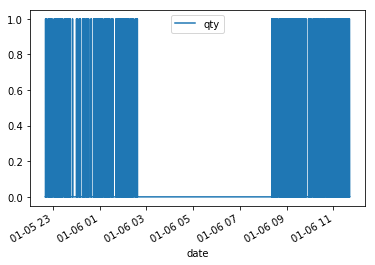

In [59]:
df = df_mo.append(df_lo)
df['date'] = pd.to_datetime(df['date'], unit='s')
df = df.set_index('date')
df = df.sort_index()
df.plot()

In [60]:
lo_with_mo_idx = df_lo['date'].apply(np.ceil).isin(df_mo['date'].apply(np.floor))
common_times = df_lo[lo_with_mo_idx]['date'].values
print(len(common_times))

568


In [81]:
lo_mo_tuples = []
arr_lo_times = np.array(df_lo['date'].values)
for t in mo_times:
    idx = np.argmin(arr_lo_times < t) - 1
    lo_mo_tuples.append((arr_lo_times[idx], t, arr_lo_times[idx + 1]))

In [ ]:
data = []

for idx, pair in enumerate(lo_mo_tuples):
    t_l1, t_m, t_l2 = pair
#     print(pair)
    if idx % 10 == 0:
        print(idx)
    
    delta = env.get_mid_price(ticker, t_l2) - env.get_mid_price(ticker, t_l1) 
    i1 = env.compute_orderbook_imbalance(ticker, t_l, depth=1)
#     i2 = env.compute_orderbook_imbalance(ticker, t_l, depth=2)
#     i3 = env.compute_orderbook_imbalance(ticker, t_l, depth=3)
#     data.append({'i1' : i1,'i2' : i2,'i3' : i3, 'delta': delta})
    data.append({'i1':i1,'delta':delta})

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660


KeyboardInterrupt: 

In [1]:
data_df = pd.DataFrame(data)

NameError: name 'pd' is not defined

In [ ]:
plt.hist(data_df['delta'])

//anaconda/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
//anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


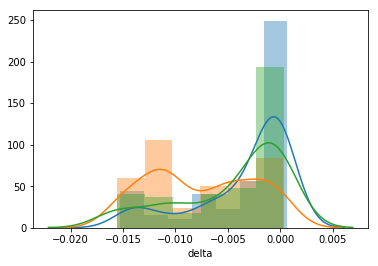

In [55]:
# sell_heavy = data_df[data_df['i1'] == 1]['delta'] + data_df[data_df['i2'] == 1]['delta'] + data_df[data_df['i3'] == 1]['delta']
# buy_heavy =  data_df[data_df['i1'] == 3]['delta'] + data_df[data_df['i2'] == 3]['delta'] + data_df[data_df['i3'] == 3]['delta']
# neutral =  data_df[data_df['i1'] == 2]['delta'] + data_df[data_df['i2'] == 2]['delta'] + data_df[data_df['i3'] == 2]['delta']
sns.distplot(data_df[data_df['i1'] == 1]['delta'])
sns.distplot(data_df[data_df['i1'] == 3]['delta'])
sns.distplot(data_df[data_df['i1'] == 2]['delta'])

# plt.hist(sell_heavy, alpha=0.7)
# plt.hist(buy_heavy, alpha=0.7)
# sns.kdeplot(data_df[data_df['imbalance'] == 3]['delta'], alpha=0.7)

In [34]:
data_df[data_df['i3'] == 1]['delta'].value_counts()

 0.000000    4
-0.000920    3
-0.001565    3
 0.000185    2
-0.000490    2
 0.000200    2
-0.000015    2
-0.001580    2
 0.000050    1
 0.000175    1
-0.000215    1
-0.000065    1
-0.000325    1
-0.000280    1
-0.002060    1
-0.000800    1
-0.000030    1
 0.000220    1
-0.000275    1
-0.000085    1
-0.000340    1
-0.000090    1
-0.001085    1
 0.000380    1
-0.000105    1
-0.000795    1
-0.000320    1
Name: delta, dtype: int64

## V2 Reading from collated book_metrics table

In [44]:
import pandas as pd
import numpy as np
import sqlite3
import matplotlib.pyplot as plt

In [808]:
def import_book_metrics():
    conn = sqlite3.connect("./datasets/hftoolkit_sqlite.db")
    metrics = pd.read_sql_query("SELECT * FROM book_metrics", conn)
    market = pd.read_sql_query("SELECT * FROM tas", conn)
    return metrics, market

def format_book_metrics(metrics, market):
    # Cleaning
    metrics['tick_delta'] = metrics['tick'].diff()
#     metrics = metrics[metrics['tick_delta'] < 2] # Really relaxed filtering of time gap
#     market['tick'] = np.floor(market['tick'])
#     metrics['tick'] = metrics['tick'].astype('int64')
#     market['tick'] = market['tick'].astype('int64')
#     metrics['tick'] = pd.to_datetime(metrics['tick'], unit='s')
#     market['tick'] = pd.to_datetime(market['tick'], unit='s')
#     r_market_orders = pd.DataFrame(market.groupby(by='tick').count()['market_id']).reset_index()
#     r_market_orders.columns = ['tick','market_orders']                           
# #     metrics = metrics.set_index('tick')
# #     market = market.set_index('tick')
#     metrics = pd.merge_asof(metrics,r_market_orders, on='tick', direction='backward')
    
# #     # target
    metrics['mid_price_change'] = metrics['mid_price'].diff()
    metrics['next_mid_price_change'] = metrics['mid_price_change'].shift(-1)
    
#     for col in [('bid_d5','ask_d5'), ('bid_d10', 'ask_d10'), ('bid_d20','ask_d20')]:
#         for t in [1,5,10,50]:
#             metrics[col[0][-2:] + '_rolling_' + str(t)] = np.array(metrics[col[0]].rolling(t).sum().values) / np.array(metrics[col[1]].rolling(t).sum().values)
    
#     metrics['imbalance_d10'] = (metrics['bid_d10'] - metrics['ask_d10']) / (metrics['bid_d10'] + metrics['ask_d10'])
#     metrics['imbalance_d20'] = (metrics['bid_d20'] - metrics['ask_d20']) / (metrics['bid_d20'] + metrics['ask_d20'])
#     metrics['imbalance_d20_rolling'] = metrics['imbalance_d20'].rolling(5).mean() 
#     metrics['mid_change_cat'] = 0
#     metrics['mid_change_cat'][metrics['next_mid_price_change'] > 0] = 1 # Increase
#     metrics['mid_change_cat'][metrics['next_mid_price_change'] < 0] = -1 # Decrease
#     metrics = metrics.drop(columns =['period_id','ticker','mid_price','mid_price_change'])
# #     metrics = metrics.drop(columns=['mid_price'])
#     metrics = metrics.dropna()
#     metrics = metrics[metrics['mid_price_change'] != 0] # Get rid of uninteresting data, we can market make on this easily
#     metrics = metrics[metrics['next_mid_price_change'] != 0]
#     metrics = metrics[metrics['market_orders'] > 0]
    
#     # Engineered
#     n_imbalance_regimes = 5
#     n_imbalance_bins = np.linspace(-1,1,n_imbalance_regimes + 1)
#     metrics['imbalance_d1_cat'] = np.digitize(metrics['imbalance_d1'], n_imbalance_bins)
    
    
#     # Correct Distribtion
#     log_features = ['bid_d5','bid_d10','bid_d20','ask_d5','ask_d10','ask_d20']
#     metrics[log_features] = np.log(metrics[log_features])
# #     metrics['mid_price_change'] = np.log(metrics['mid_price_change'] + np.abs(metrics['mid_price_change'].min()) + 1)
#     metrics['ask_d20_cat'] = np.digitize(metrics['ask_d20'], np.linspace(-4,4,5+1))
    return metrics, market

metrics, market = import_book_metrics()
metrics, market = format_book_metrics(metrics, market)

In [840]:
metrics.columns

Index(['period_id', 'tick', 'ticker', 'bid_d5', 'bid_d10', 'bid_d20', 'ask_d5',
       'ask_d10', 'ask_d20', 'imbalance_d1', 'imbalance_d2', 'imbalance_d3',
       'slope', 'bid_ask_spread', 'mid_price', 'market_orders', 'tick_delta',
       'mid_price_change', 'next_mid_price_change'],
      dtype='object')

### Looking at the information provided by imbalance and bid ask spread in predicting next mid price change

In [860]:
X = metrics[['tick','bid_d5','ask_d5','bid_d10','ask_d10','bid_d20','ask_d20','market_orders','next_mid_price_change']]
X['tick'] = pd.to_datetime(X['tick'], unit='s')
X = X.set_index('tick')
X = X.fillna(0)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [861]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import VAR

In [862]:
def adf_test(df, col):
    result = adfuller(df[col])
    print(col)
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

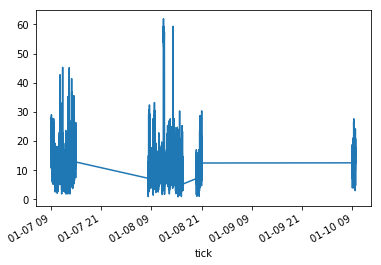

In [863]:
X['ask_d10'].plot()

In [864]:
# Check for stationarity (Looks pretty good)
for col in X.columns:
    adf_test(X.dropna(), col)

bid_d5
ADF Statistic: -10.868216117297957
p-value: 1.3898511716991814e-19
Critical Values:
	10%: -2.5668435437033184
	5%: -2.861678169334682
	1%: -3.430662624405906
ask_d5
ADF Statistic: -13.730166521045005
p-value: 1.1441096453760943e-25
Critical Values:
	10%: -2.5668436211319157
	5%: -2.8616783148002107
	1%: -3.43066295355616
bid_d10
ADF Statistic: -8.383678306198355
p-value: 2.471084498220307e-13
Critical Values:
	10%: -2.566843561286422
	5%: -2.861678202368156
	1%: -3.4306626991519704
ask_d10
ADF Statistic: -10.395102607320068
p-value: 1.9745995016253976e-18
Critical Values:
	10%: -2.5668435472192668
	5%: -2.8616781759401135
	1%: -3.43066263935226
bid_d20
ADF Statistic: -6.530282929719986
p-value: 9.90927468932116e-09
Critical Values:
	10%: -2.5668436281789644
	5%: -2.8616783280395395
	1%: -3.4306629835132827
ask_d20
ADF Statistic: -8.72519763031512
p-value: 3.3030278583468296e-14
Critical Values:
	10%: -2.5668436246552715
	5%: -2.8616783214195585
	1%: -3.4306629685340044
market_or

In [865]:
model = VAR(X)
results = model.fit(3)
results.summary()

//anaconda/lib/python3.5/site-packages/statsmodels/tsa/vector_ar/var_model.py:461: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  params = np.linalg.lstsq(z, y_sample)[0]


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 10, Jan, 2020
Time:                     10:20:04
--------------------------------------------------------------------
No. of Equations:         8.00000    BIC:                    12.5400
Nobs:                     20936.0    HQIC:                   12.4888
Log likelihood:          -367929.    FPE:                    258857.
AIC:                      12.4640    Det(Omega_mle):         256397.
--------------------------------------------------------------------
Results for equation bid_d5
                              coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------
const                            0.067906         0.068571            0.990           0.322
L1.bid_d5                        0.649648         0.007920           82.023           0.000
L1.ask_d5      

### Initial EDA

In [287]:
metrics.columns

Index(['period_id', 'tick', 'ticker', 'bid_d5', 'bid_d10', 'bid_d20', 'ask_d5',
       'ask_d10', 'ask_d20', 'imbalance_d1', 'imbalance_d2', 'imbalance_d3',
       'slope', 'bid_ask_spread', 'mid_price', 'market_orders_x', 'tick_delta',
       'market_orders_y', 'mid_price_change', 'next_mid_price_change',
       'd5_rolling_1', 'd5_rolling_5', 'd5_rolling_10', 'd5_rolling_50',
       '10_rolling_1', '10_rolling_5', '10_rolling_10', '10_rolling_50',
       '20_rolling_1', '20_rolling_5', '20_rolling_10', '20_rolling_50'],
      dtype='object')

In [289]:
metrics['market_orders_y']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       1.0
8       1.0
9       1.0
10      1.0
11      1.0
12      1.0
13      1.0
14      1.0
15      1.0
16      1.0
17      1.0
18      1.0
19      1.0
20      1.0
21      1.0
22      1.0
23      1.0
24      1.0
25      1.0
26      1.0
27      1.0
28      1.0
29      1.0
       ... 
7623    1.0
7624    1.0
7625    1.0
7626    1.0
7627    1.0
7628    1.0
7629    1.0
7630    1.0
7631    1.0
7632    1.0
7633    1.0
7634    1.0
7635    1.0
7636    1.0
7637    1.0
7638    1.0
7639    1.0
7640    1.0
7641    1.0
7642    1.0
7643    1.0
7644    1.0
7645    1.0
7646    1.0
7647    1.0
7648    1.0
7649    1.0
7650    1.0
7651    1.0
7652    1.0
Name: market_orders_y, Length: 7653, dtype: float64

In [193]:
metrics['mid_price_change'].plot()
# metrics['bid_ask_spread'].plot(secondary_y=True,alpha=0.2)
metrics['market_orders'].plot(secondary_y=True, alpha=0.2)

//anaconda/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
//anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


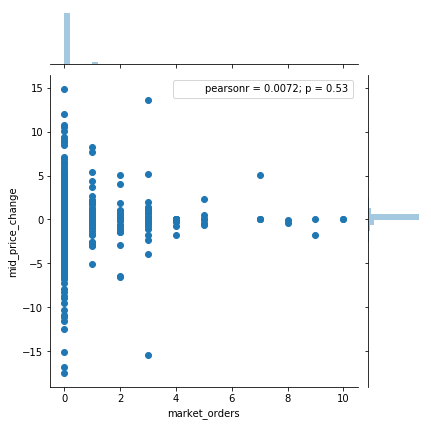

In [257]:
sns.jointplot(metrics['market_orders'], metrics['mid_price_change'])

In [295]:
metrics[['tick','market_orders_y']]

,tick,market_orders_y
0,2020-01-07 09:05:06,NaN
1,2020-01-07 09:05:07,NaN
2,2020-01-07 09:05:08,NaN
3,2020-01-07 09:05:09,NaN
4,2020-01-07 09:05:10,NaN
5,2020-01-07 09:05:11,NaN
6,2020-01-07 09:05:12,NaN
7,2020-01-07 09:05:13,1.0
8,2020-01-07 09:05:14,1.0
9,2020-01-07 09:05:15,1.0


In [296]:
nmarket['tick']

0      2020-01-07 09:05:12.194305000
1      2020-01-07 09:05:18.729260000
2      2020-01-07 09:05:36.701159000
3      2020-01-07 09:05:38.650201000
4      2020-01-07 09:05:38.826003000
5      2020-01-07 09:05:38.908608000
6      2020-01-07 09:05:39.029296000
7      2020-01-07 09:05:42.213159000
8      2020-01-07 09:05:42.267618000
9      2020-01-07 09:05:42.943741000
10     2020-01-07 09:07:39.611482000
11     2020-01-07 09:08:02.969584000
12     2020-01-07 09:08:08.241490000
13     2020-01-07 09:08:08.320256000
14     2020-01-07 09:08:08.438379000
15     2020-01-07 09:08:11.472877000
16     2020-01-07 09:08:12.140007000
17     2020-01-07 09:08:12.334328000
18     2020-01-07 09:08:27.204116000
19     2020-01-07 09:09:42.412402000
20     2020-01-07 09:09:44.641158000
21     2020-01-07 09:09:44.904331000
22     2020-01-07 09:09:54.361284000
23     2020-01-07 09:10:08.416768000
24     2020-01-07 09:10:08.523618999
25     2020-01-07 09:10:08.655618000
26     2020-01-07 09:10:11.692297000
2

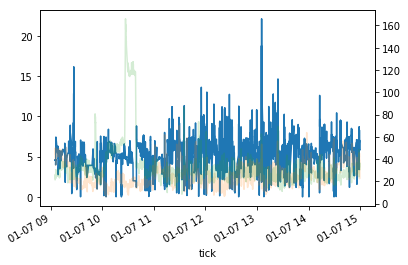

In [86]:
metrics['bid_ask_spread'].plot()
metrics['ask_d20'].plot(secondary_y=True,alpha=0.2)
metrics['bid_d20'].plot(secondary_y=True,alpha=0.2)

In [38]:
metrics['mid_price'].plot()
metrics['ask_d5'].plot(secondary_y=True,alpha=0.2)
metrics['bid_d5'].plot(secondary_y=True,alpha=0.2)

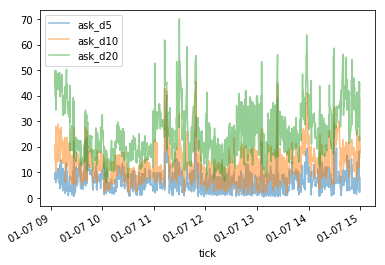

In [51]:
metrics[['ask_d5','ask_d10','ask_d20']].plot(alpha=0.5)

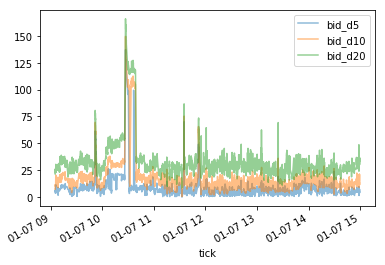

In [64]:
metrics[['bid_d5','bid_d10','bid_d20']].plot(alpha=0.5)

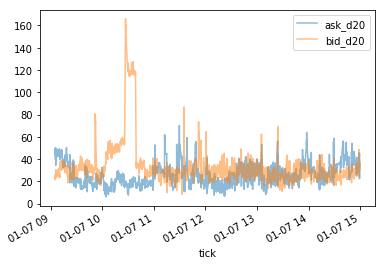

In [72]:
metrics[['ask_d20','bid_d20']].plot(alpha=0.5)

In [141]:
metrics[['imbalance_d10','imbalance_d20']].plot(alpha=0.5)
metrics['next_mid_price_change'].plot(alpha=0.5, secondary_y=True)

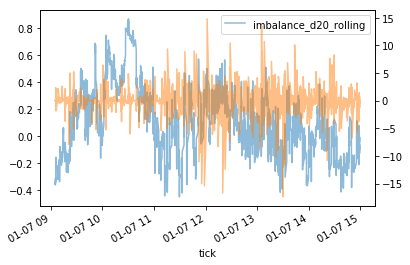

In [150]:
metrics[['imbalance_d20_rolling']].plot(alpha=0.5)
metrics['next_mid_price_change'].plot(alpha=0.5, secondary_y=True)

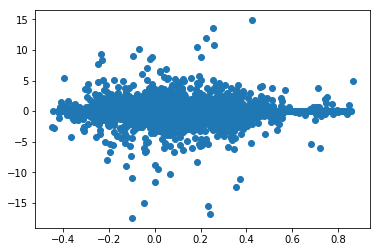

In [149]:
plt.scatter(metrics['imbalance_d20_rolling'], metrics['next_mid_price_change'])

### Build a linear model to explain change in mid-price

In [4]:
import seaborn as sns
%matplotlib inline

#### EDA

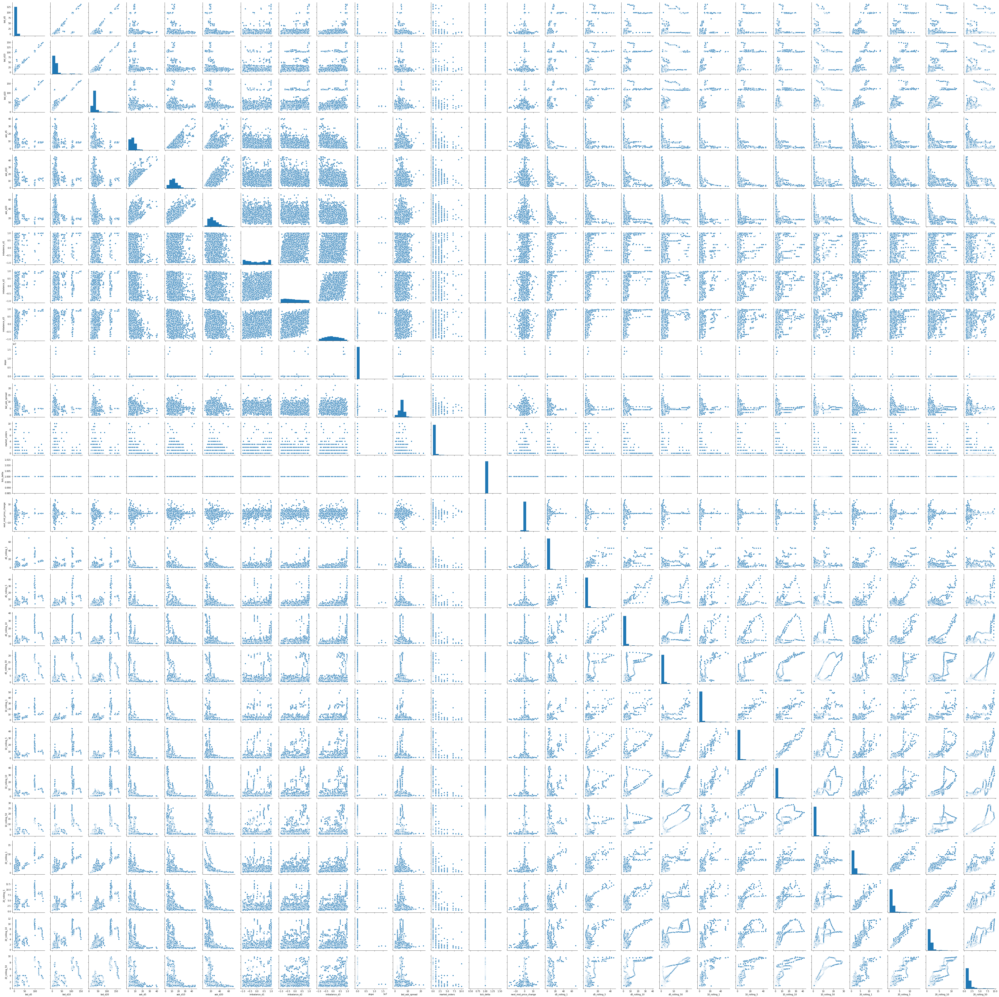

In [184]:
sns.pairplot(metrics)

In [181]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [182]:
data = metrics[metrics['next_mid_price_change'] != 0]
X, y = data.drop(columns='next_mid_price_change'), data['next_mid_price_change']
scalerX = StandardScaler()
scalerY = StandardScaler()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_train = scalerX.fit_transform(X_train)
X_test = scalerX.transform(X_test)

for i in range(-10,3):
    clf = SVR(gamma=10**i, kernel='rbf')
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(np.mean(np.power(y_pred - y_test,2)))

4.020308781926134
4.020308171319484
4.020302067248573
4.020239815104787
4.019676707371627
4.017750583094052
4.010291500782503
3.996625137090963
3.96739600694669
4.010224570827032
4.022751185515023
4.012417805443262
4.015846082670521


### V3 Visualising the book

In [298]:
import pandas as pd
import numpy as np
import sqlite3
import matplotlib.pyplot as plt

def import_book():
    conn = sqlite3.connect("./datasets/hftoolkit_sqlite.db")
    metrics = pd.read_sql_query("SELECT * FROM book", conn)
    market = pd.read_sql_query("SELECT * FROM tas", conn)
    return metrics, market

In [387]:
book, market = import_book()

## Principle components of orderbook volume over time

In [396]:
import math
def round_nearest(x, a=0.05):
    return round(round(x / a) * a, -int(math.floor(math.log10(a))))

In [489]:
book_tapq = book[['tick','action','price','quantity']]
# book_tapq['price'] = book_tapq['price'].apply(round_nearest)

In [490]:
book_qty = book_tapq.groupby(by=['tick','action','price']).sum().reset_index()

In [491]:
min_price = pd.DataFrame(book_qty.groupby(by=['tick','action']).min()['price'])
max_price = pd.DataFrame(book_qty.groupby(by=['tick','action']).max()['price'])

In [492]:
temp = book_qty.set_index(['tick','action'])
temp = temp.merge(min_price, left_index=True, right_index=True, suffixes=('','_min'))
temp = temp.merge(max_price, left_index=True, right_index=True, suffixes=('','_max'))

In [493]:
temp = temp.reset_index()
temp['price_offset'] = 0
buy_f = temp['action'] == 'BUY'
sell_f = temp['action'] == 'SELL'
temp['price_offset'][buy_f] = temp['price'][buy_f] - temp['price_max'][buy_f]
temp['price_offset'][sell_f] = temp['price'][sell_f] - temp['price_min'][sell_f]

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [531]:
tick_bin_size = 0.01
max_delta = 20
qty_bins = np.arange(-20,20,0.01).round(2) # 80 Bid & 80 Ask Levels
ticks = book_qty['tick'].unique() # All Times

In [532]:
book_depth_80 = np.zeros((ticks.shape[0],qty_bins.shape[0]))
book_depth_80 = pd.DataFrame(book_depth_80, index=ticks, columns=qty_bins)
book_depth_80

,-20.0,-19.99,-19.98,-19.97,-19.96,-19.95,-19.94,-19.93,-19.92,-19.91,...,19.9,19.91,19.92,19.93,19.94,19.95,19.96,19.97,19.98,19.99
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.578388e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


//anaconda/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
//anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


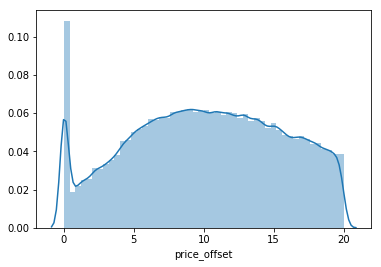

In [558]:
sns.distplot(temp['price_offset'][temp['price_offset'].abs() <= max_delta].abs())

In [571]:
temp_depth_80 = temp[temp['price_offset'].abs() <= max_delta]
temp_depth_80['price_offset'] = temp_depth_80['price_offset'].round(2)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [572]:
pivot = temp_depth_80[['tick','price_offset','quantity']]
pivoted = pivot.pivot_table(index='tick',columns='price_offset', values='quantity')

In [563]:
pivoted.columns = [round(c, 2) for c in pivoted.columns]

In [578]:
book_by_offset_tick = pivoted.fillna(0)

In [584]:
book_by_offset_tick.to_csv('./datasets/book_prepped_for_pca.csv')

In [585]:
X = book_by_offset_tick.iloc[:,1750:2251]

In [586]:
from sklearn.decomposition import PCA

In [587]:
pca = PCA()
pca.fit(X)

components to keep: 37


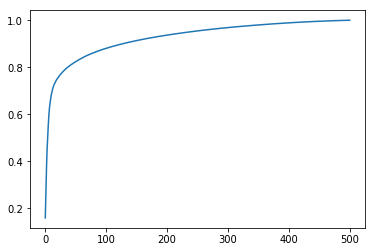

In [601]:
explained = pca.explained_variance_ratio_.cumsum()
plt.plot(explained)
keep_n_components = np.argmin(explained < 0.8)
print("components to keep: %s" % keep_n_components)

In [606]:
top_n_components = pca.components_[:keep_n_components+1,:]

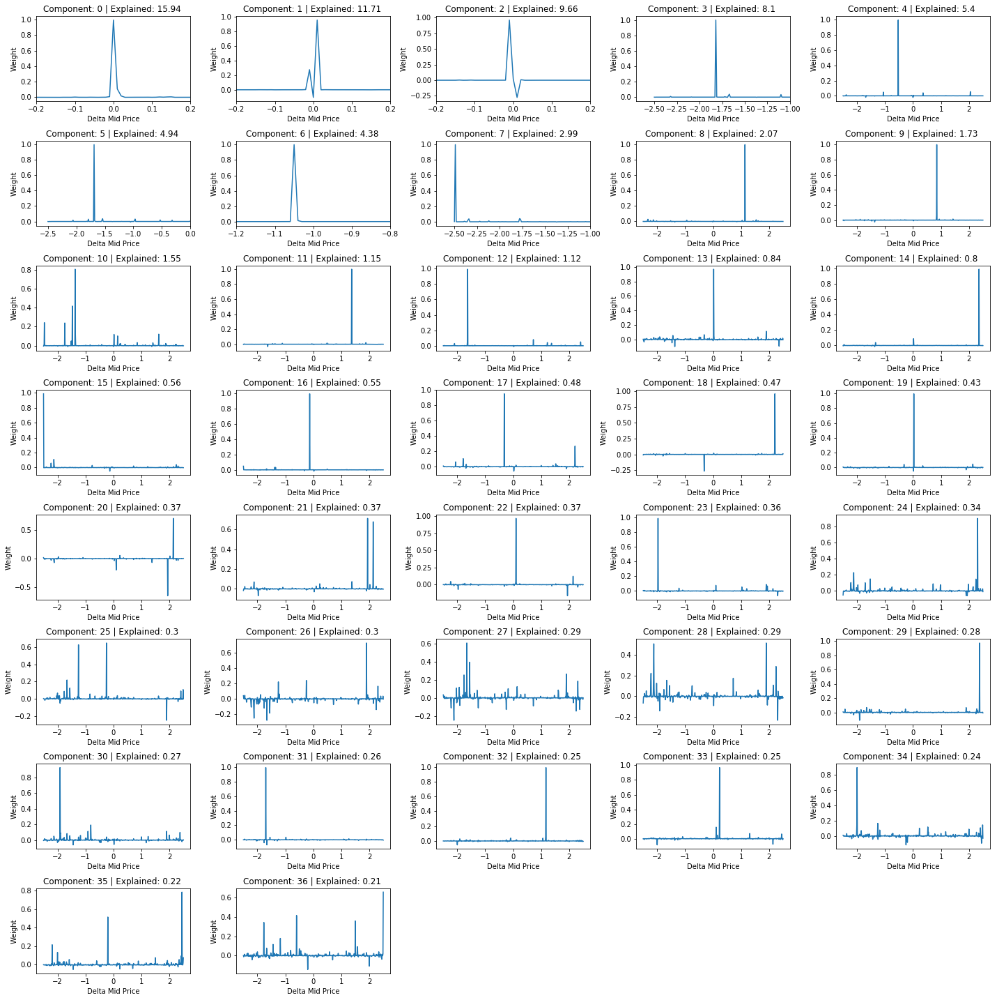

In [645]:
plt.figure(figsize=(20,20))
grid = (8,5)
for i in range(keep_n_components):
    ax = plt.subplot2grid(grid,(i//5,i%5))
    ax.plot(np.arange(-2.5,2.51,0.01),top_n_components[i])
    ax.set_xlabel('Delta Mid Price')
    ax.set_ylabel('Weight')
    ax.set_title("Component: %s | Explained: %s " % (i, round(pca.explained_variance_ratio_[i] *100,2)))
    
    if i <= 2:
        ax.set_xlim(-0.2,0.2)
    if i == 3:
        ax.set_xlim(-2.7,-1)
    if i == 5:
        ax.set_xlim(-2.7,0)
    if i == 6:
        ax.set_xlim(-1.2,-0.8)
    if i == 7:
        ax.set_xlim(-2.7,-1)
    
plt.tight_layout()

# Component 0: Best (Bid / Ask) and Shallow (Bid / Ask)
# Component 1: Divergence of Shallow Depths vs Best Bid Ask (Skewed to ask)
# Component 2: Divergence between Shallow Bid and Shallow Ask
# Component 3: Deep Bid Side of orderbook
# Component 4: Medium Bid Side of orderbook
# Component 5: Deep Bid Side of book
# Component 6: Medium Bid Side of book
# Component 7: Deep Bid Side of book
# Component 8: Medium Ask side of book
# Component 9: Medium Ask side of book
# Component 10: Medium to deep bid, Small emphasis on bestbid + ask and ask side of book

In [805]:
(np.abs(top_n_components[2]) > 0.2) 

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

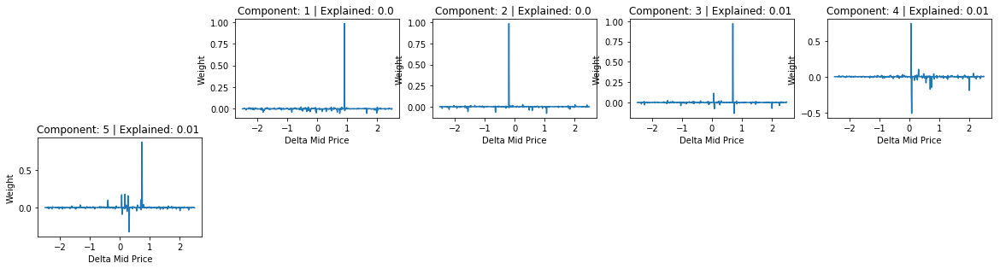

In [651]:
plt.figure(figsize=(20,20))
grid = (8,5)
for i in range(1,6):
    ax = plt.subplot2grid(grid,(i//5,i%5))
    ax.plot(np.arange(-2.5,2.51,0.01),pca.components_[-i,:])
    ax.set_xlabel('Delta Mid Price')
    ax.set_ylabel('Weight')
    ax.set_title("Component: %s | Explained: %s " % (i, round(pca.explained_variance_ratio_[-i] *100,2)))
    

# Components with least variability

In [659]:
top_n_components[0:3].T.shape

(501, 3)

In [735]:
p_over_time = pd.DataFrame(X.values @ top_n_components[0:3].T, index=X.index, columns=['PC1','PC2','PC3'])

In [709]:
min_price = temp[['tick','price_min']].drop_duplicates().set_index('tick')
p_over_time = p_over_time.merge(min_price, left_index=True, right_index=True)

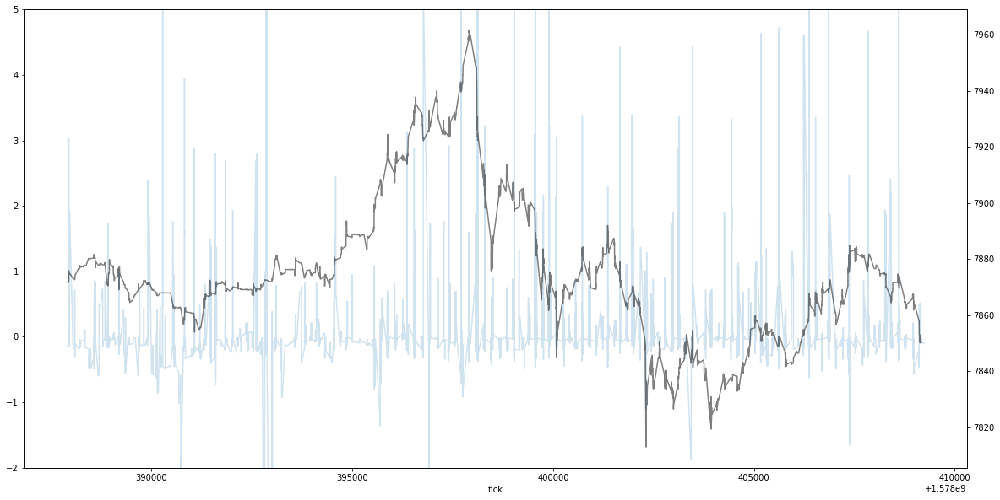

In [797]:
plt.figure()
x = p_over_time.iloc[:,1][p_over_time.index < 420000 + 1.578e9]
p_over_time.iloc[:,1][p_over_time.index < 420000 + 1.578e9].plot(figsize=(20,10), alpha=0.2, ylim=(-2,5))
m = metrics.set_index('tick')['mid_price']
m[m.index < 420000 + 1.578e9].plot(secondary_y=True, alpha=0.5, c='k')

In [754]:
p = p_over_time.reset_index()
p['tick'] = p['tick'].round()
p = p.set_index('tick')

In [756]:
merged = pd.DataFrame(m).merge(p, left_index=True, right_index=True)
merged['diff'] = merged['mid_price'].diff()

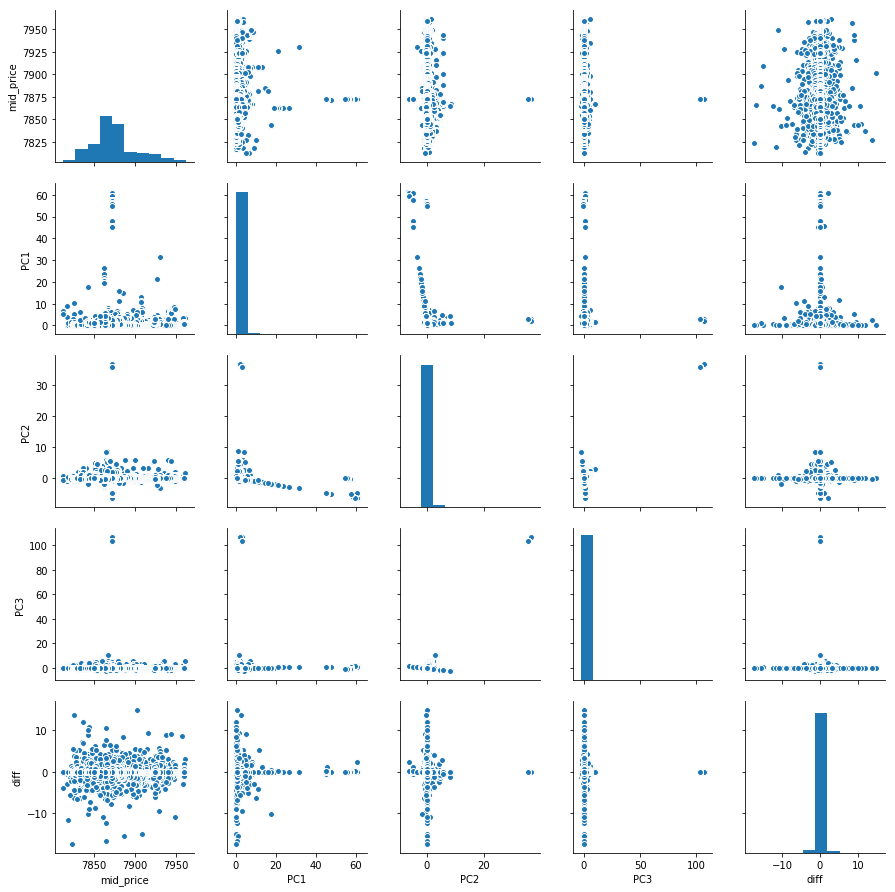

In [763]:
sns.pairplot(merged[merged.index < 420000 + 1.578e9].dropna())

In [750]:
p_over_time.index[0]

1578387905.8530009

## Visualising the book

In [301]:
book_consolidated = book[['tick','price','quantity']].groupby(by=['tick','price']).sum()

In [307]:
book_consolidated = book_consolidated.reset_index()

In [312]:
pivot_book = book_consolidated.pivot("price","tick", "quantity")

In [317]:
pivot_book.to_csv('./datasets/book_evolution.csv')

In [331]:
pivot_book_f = (pivot_book + 1).fillna(1)

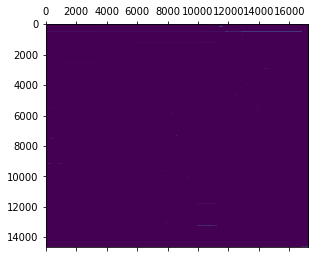

In [333]:
plt.matshow(pivot_book_f)

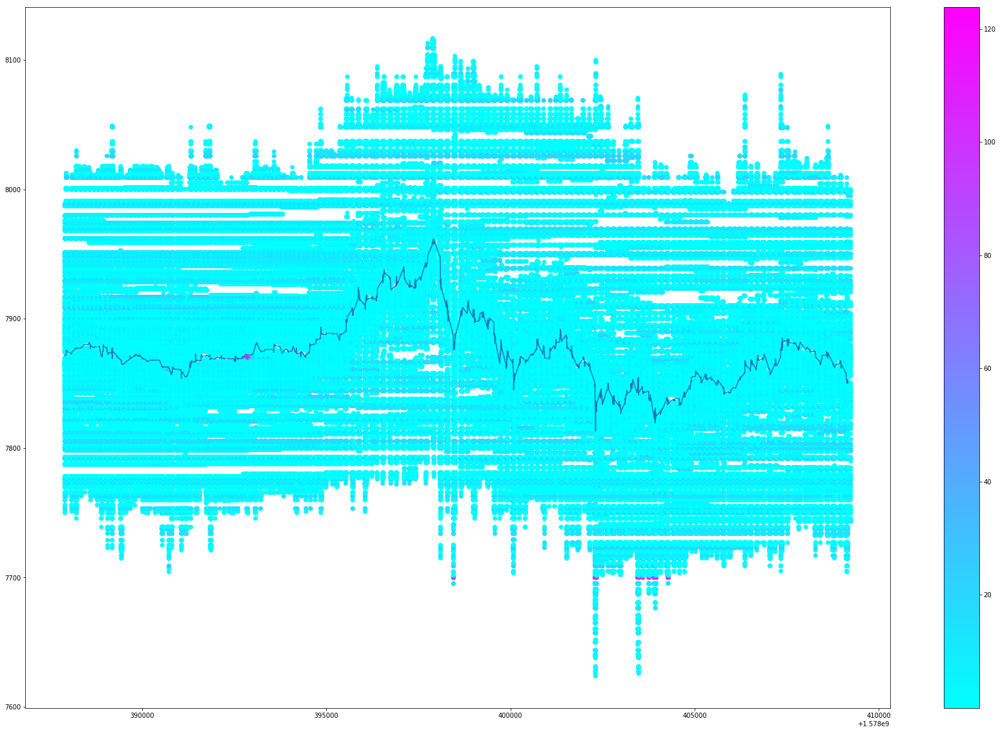

In [372]:
plt.figure(figsize=(30,20))
book_day = book_consolidated[book_consolidated['tick'] < (1578445261000 / 1000)]
a = book_day['quantity'].values
# An example colormap
colormap = plt.cm.cool 
# Normalize using the min and max values in a
normalize = plt.Normalize(vmin=min(a), vmax=max(a))
# scatter plot with the parameters defined above
plt.scatter(book_day['tick'].values, y=book_day['price'].values, c=a, cmap=colormap, marker='o')
plt.colorbar()
plt.plot(metrics[metrics['tick'] < (1578445261000 / 1000)]['tick'],metrics[metrics['tick'] < (1578445261000 / 1000)]['mid_price'])

//anaconda/lib/python3.5/site-packages/pandas/core/generic.py:5984: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
//anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2885: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


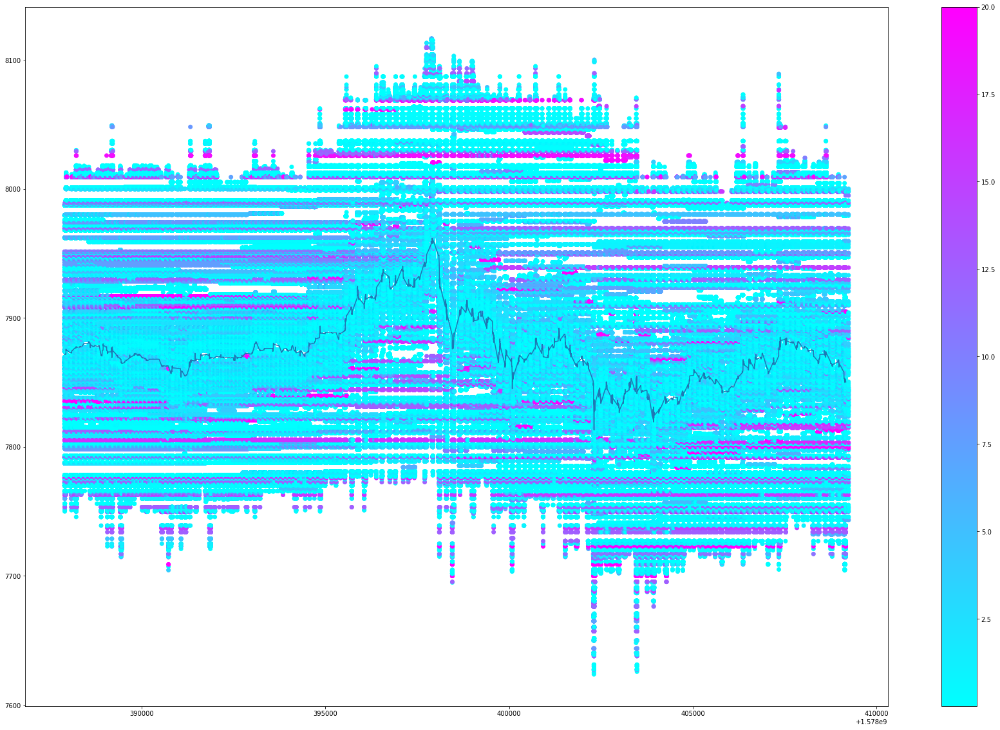

In [375]:
plt.figure(figsize=(30,20))
book_day = book_consolidated[book_consolidated['tick'] < (1578445261000 / 1000)]
clip_value = 20
book_day['quantity'][book_day['quantity'] >= clip_value] = clip_value
a = book_day['quantity'].values
# An example colormap
colormap = plt.cm.cool 
# Normalize using the min and max values in a
normalize = plt.Normalize(vmin=min(a), vmax=max(a))
# scatter plot with the parameters defined above
plt.scatter(book_day['tick'].values, y=book_day['price'].values, c=a, cmap=colormap, marker='o', s=5)
plt.colorbar()
plt.plot(metrics[metrics['tick'] < (1578445261000 / 1000)]['tick'],metrics[metrics['tick'] < (1578445261000 / 1000)]['mid_price'])

//anaconda/lib/python3.5/site-packages/pandas/core/generic.py:5984: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
//anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2885: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


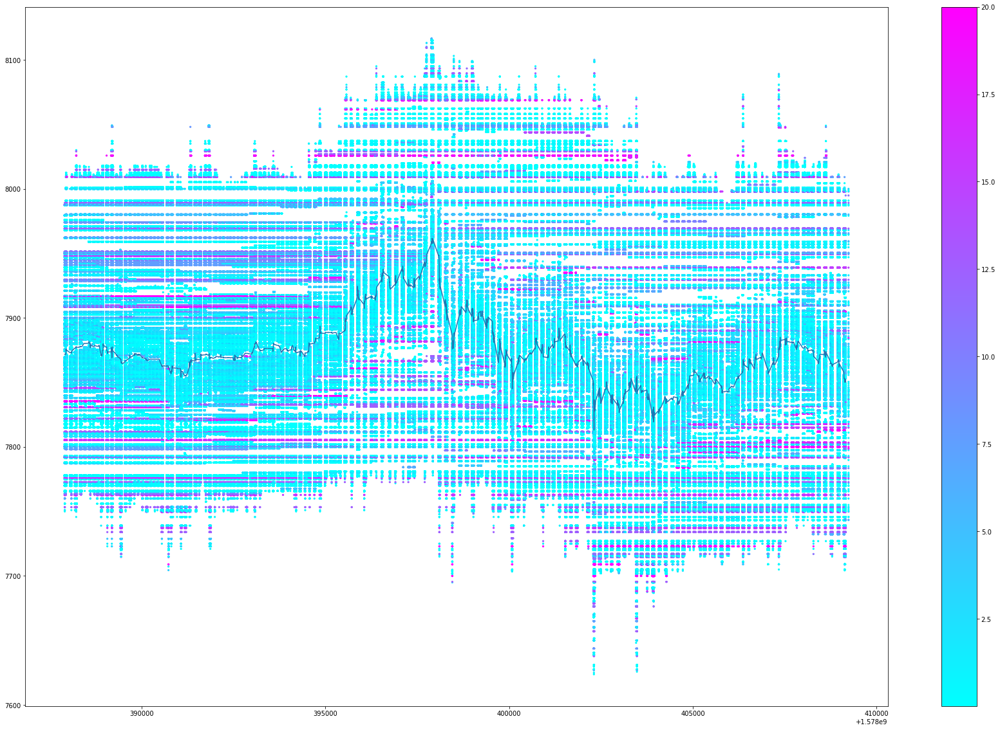

In [382]:
plt.figure(figsize=(30,20))
book_day = book_consolidated[book_consolidated['tick'] < (1578445261000 / 1000)]
clip_value = 20
book_day['quantity'][book_day['quantity'] >= clip_value] = clip_value
a = book_day['quantity'].values
# An example colormap
colormap = plt.cm.cool 
# Normalize using the min and max values in a
normalize = plt.Normalize(vmin=min(a), vmax=max(a))
# scatter plot with the parameters defined above
plt.scatter(book_day['tick'].values, y=book_day['price'].values, c=a, cmap=colormap, marker='o', s=5)
plt.colorbar()
plt.plot(metrics[metrics['tick'] < (1578445261000 / 1000)]['tick'],metrics[metrics['tick'] < (1578445261000 / 1000)]['mid_price'])

//anaconda/lib/python3.5/site-packages/pandas/core/generic.py:5984: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
//anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2885: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


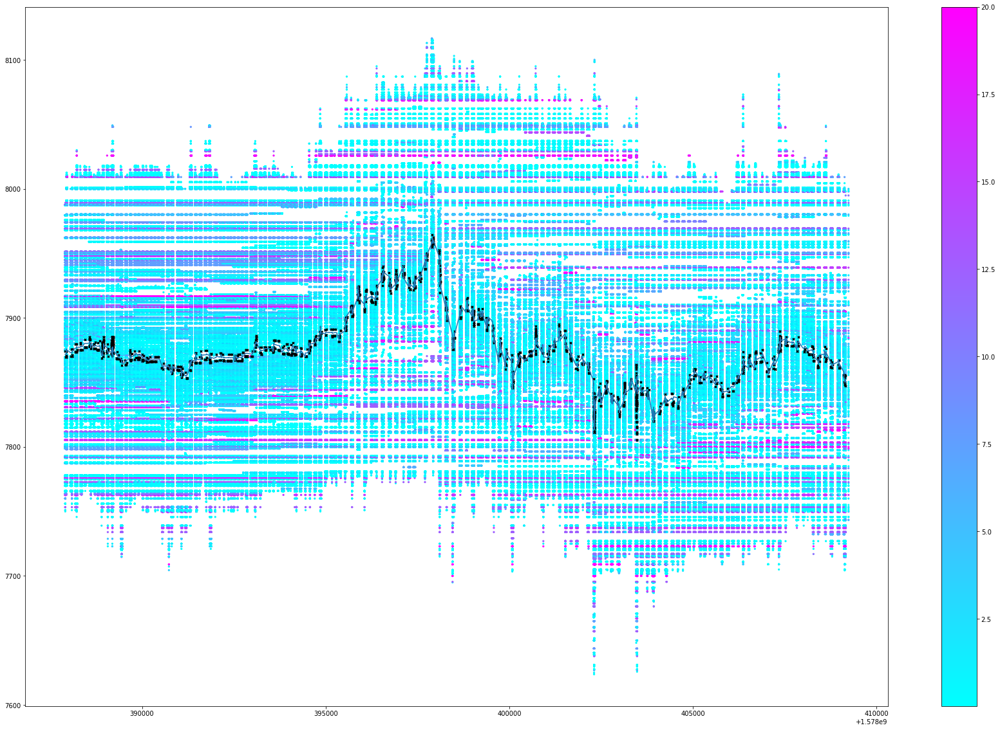

In [385]:
plt.figure(figsize=(30,20))
book_day = book_consolidated[book_consolidated['tick'] < (1578445261000 / 1000)]
market_day = market[market['tick'] < (1578445261000 / 1000)]
clip_value = 20
book_day['quantity'][book_day['quantity'] >= clip_value] = clip_value
a = book_day['quantity'].values
# An example colormap
colormap = plt.cm.cool 
# Normalize using the min and max values in a
normalize = plt.Normalize(vmin=min(a), vmax=max(a))
# scatter plot with the parameters defined above
plt.scatter(book_day['tick'].values, y=book_day['price'].values, c=a, cmap=colormap, marker='o', s=5)
plt.colorbar()
plt.plot(metrics[metrics['tick'] < (1578445261000 / 1000)]['tick'],metrics[metrics['tick'] < (1578445261000 / 1000)]['mid_price'])
plt.scatter(market_day['tick'].values, y=market_day['price'].values, c='k', marker='x', s=10)

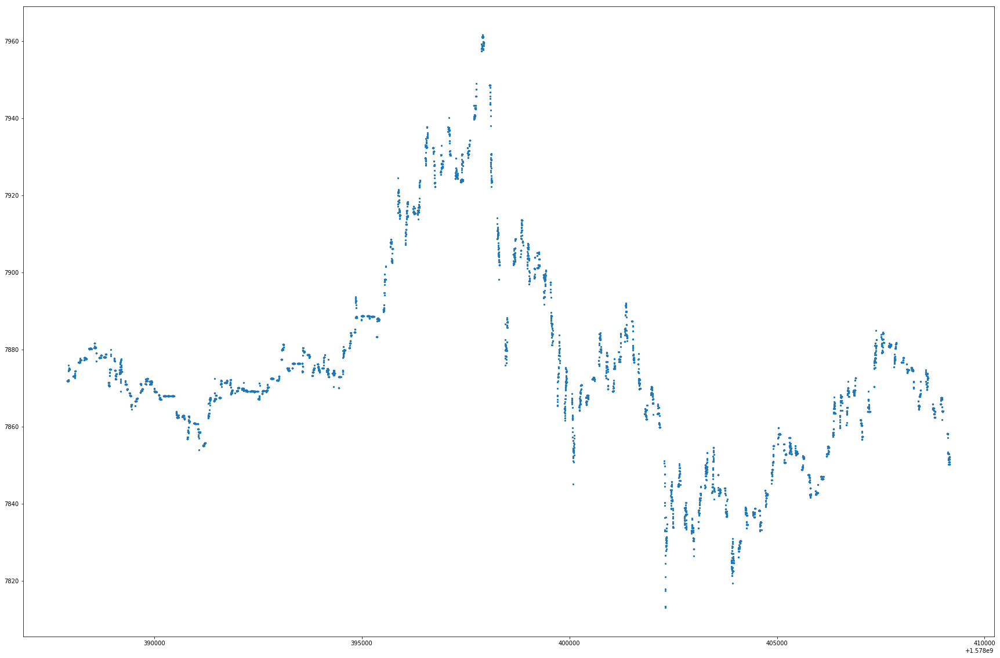

In [381]:
plt.figure(figsize=(30,20))
plt.scatter(metrics[metrics['tick'] < (1578445261000 / 1000)]['tick'],metrics[metrics['tick'] < (1578445261000 / 1000)]['mid_price'], s=5)

In [386]:
book_consolidated

,tick,price,quantity
0,1.578388e+09,7762.79,15.474700
1,1.578388e+09,7764.01,4.937000
2,1.578388e+09,7765.51,0.025634
3,1.578388e+09,7765.89,0.100000
4,1.578388e+09,7769.81,0.008000
5,1.578388e+09,7770.11,0.200000
6,1.578388e+09,7770.12,0.514793
7,1.578388e+09,7771.88,0.005839
8,1.578388e+09,7772.71,12.550000
9,1.578388e+09,7775.00,0.539930
